In [2]:
import pandas as pd
import os
import numpy as np
from glob import glob
from onekey_algo.custom.components.comp2 import split_dataset4sol
from onekey_algo import get_param_in_cwd

root = get_param_in_cwd('data_root')
patch_info = pd.concat([pd.read_csv(f) for f in glob(os.path.join(root, 'patches', '*/patch_info.csv'))], axis=0)
patch_info['ID'] = patch_info['label']
patch_info['filename'] = patch_info['filename'].map(lambda x: os.path.basename(x))
patch_info = patch_info[patch_info['ID'] != '_background_']
display(len(set(patch_info['ID'])))
patch_info

319

,filename,label_id,label,info,ID
1501,HBre-Duc140Sur-01_59904_41472_2304_11008_2560_...,37,J07A0969,"{""_background_"": 0.4931640625, ""J07A0969"": 0.5...",J07A0969
1502,HBre-Duc140Sur-01_59904_41472_2304_11264_2560_...,37,J07A0969,"{""_background_"": 0.46875, ""J07A0969"": 0.53125}",J07A0969
1630,HBre-Duc140Sur-01_59904_41472_2560_2560_2816_2...,1,J07A0929,"{""_background_"": 0.494140625, ""J07A0929"": 0.50...",J07A0929
1631,HBre-Duc140Sur-01_59904_41472_2560_2816_2816_3...,1,J07A0929,"{""_background_"": 0.0927734375, ""J07A0929"": 0.9...",J07A0929
1632,HBre-Duc140Sur-01_59904_41472_2560_3072_2816_3...,1,J07A0929,"{""J07A0929"": 1.0}",J07A0929
...,...,...,...,...,...
37323,HBreD145Su01_61952_40960_59648_11008_59904_112...,64,J07A0997,"{""J07A0997"": 1.0}",J07A0997
37324,HBreD145Su01_61952_40960_59648_11264_59904_115...,64,J07A0997,"{""J07A0997"": 1.0}",J07A0997
37325,HBreD145Su01_61952_40960_59648_11520_59904_117...,64,J07A0997,"{""J07A0997"": 1.0}",J07A0997
37326,HBreD145Su01_61952_40960_59648_11776_59904_120...,64,J07A0997,"{""_background_"": 0.03125, ""J07A0997"": 0.96875}",J07A0997


In [3]:
import pandas as pd
import os
import numpy as np
from glob import glob
from onekey_algo.custom.components.comp2 import split_dataset4sol
from onekey_algo import get_param_in_cwd

root = get_param_in_cwd('data_root')
patches = pd.DataFrame(glob(os.path.join(root, 'patches', '*', '*.jpg')), columns=['fpath'])
patches['ID'] = patches['fpath'].map(lambda x: os.path.basename(os.path.dirname(x)))
patches['filename'] = patches['fpath'].map(lambda x: os.path.basename(x))
patches                            

,fpath,ID,filename
0,D:\\20250416-LiHaiYu\patches\HBre-Duc140Sur-01...,HBre-Duc140Sur-01,HBre-Duc140Sur-01_59904_41472_10240_10240_1049...
1,D:\\20250416-LiHaiYu\patches\HBre-Duc140Sur-01...,HBre-Duc140Sur-01,HBre-Duc140Sur-01_59904_41472_10240_10496_1049...
2,D:\\20250416-LiHaiYu\patches\HBre-Duc140Sur-01...,HBre-Duc140Sur-01,HBre-Duc140Sur-01_59904_41472_10240_10752_1049...
3,D:\\20250416-LiHaiYu\patches\HBre-Duc140Sur-01...,HBre-Duc140Sur-01,HBre-Duc140Sur-01_59904_41472_10240_11008_1049...
4,D:\\20250416-LiHaiYu\patches\HBre-Duc140Sur-01...,HBre-Duc140Sur-01,HBre-Duc140Sur-01_59904_41472_10240_11264_1049...
...,...,...,...
89946,D:\\20250416-LiHaiYu\patches\HBreD145Su01\HBre...,HBreD145Su01,HBreD145Su01_61952_40960_9984_7936_10240_8192.jpg
89947,D:\\20250416-LiHaiYu\patches\HBreD145Su01\HBre...,HBreD145Su01,HBreD145Su01_61952_40960_9984_8192_10240_8448.jpg
89948,D:\\20250416-LiHaiYu\patches\HBreD145Su01\HBre...,HBreD145Su01,HBreD145Su01_61952_40960_9984_8448_10240_8704.jpg
89949,D:\\20250416-LiHaiYu\patches\HBreD145Su01\HBre...,HBreD145Su01,HBreD145Su01_61952_40960_9984_8704_10240_8960.jpg


In [4]:
patches = pd.merge(patch_info[['filename', 'ID']], patches[['filename', 'fpath']], on='filename', how='inner')
patches.to_csv(os.path.join(root, 'patch_info.csv'), index=False)
patches

,filename,ID,fpath
0,HBre-Duc140Sur-01_59904_41472_2560_3072_2816_3...,J07A0929,D:\\20250416-LiHaiYu\patches\HBre-Duc140Sur-01...
1,HBre-Duc140Sur-01_59904_41472_2560_3328_2816_3...,J07A0929,D:\\20250416-LiHaiYu\patches\HBre-Duc140Sur-01...
2,HBre-Duc140Sur-01_59904_41472_2560_3584_2816_3...,J07A0929,D:\\20250416-LiHaiYu\patches\HBre-Duc140Sur-01...
3,HBre-Duc140Sur-01_59904_41472_2560_3840_2816_4...,J07A0929,D:\\20250416-LiHaiYu\patches\HBre-Duc140Sur-01...
4,HBre-Duc140Sur-01_59904_41472_2560_6912_2816_7...,J07A0947,D:\\20250416-LiHaiYu\patches\HBre-Duc140Sur-01...
...,...,...,...
88738,HBreD145Su01_61952_40960_59392_3584_59648_3840...,J07A0956,D:\\20250416-LiHaiYu\patches\HBreD145Su01\HBre...
88739,HBreD145Su01_61952_40960_59392_10496_59648_107...,J07A0997,D:\\20250416-LiHaiYu\patches\HBreD145Su01\HBre...
88740,HBreD145Su01_61952_40960_59392_10752_59648_110...,J07A0997,D:\\20250416-LiHaiYu\patches\HBreD145Su01\HBre...
88741,HBreD145Su01_61952_40960_59392_11008_59648_112...,J07A0997,D:\\20250416-LiHaiYu\patches\HBreD145Su01\HBre...


In [5]:
import os, shutil
import pandas as pd
from onekey_algo import get_param_in_cwd
from onekey_algo.custom.components.comp2 import split_dataset4sol
from onekey_algo.custom.utils import print_join_info

root = get_param_in_cwd('data_root')
sur_data = pd.read_csv(os.path.join(root, 'survival.csv')).drop_duplicates('ID')
print_join_info(patches, sur_data)
sur_data = pd.merge(sur_data, patches[['ID']].drop_duplicates('ID'), on='ID', how='inner')
display(sur_data)
sur_data['group'] = 'train'
train_data = sur_data[sur_data['group'] == 'train']
test_data = sur_data[sur_data['group'] != 'train']
ds = split_dataset4sol(train_data, cv=False, n_trails=10, test_size=0.33, save_dir=root, shuffle=True)

[2025-09-12 20:49:25 - __init__.py:  63]	WARNING	存在ID特征不完全匹配的问题！在左边不在右边的ID：['J07A0931', 'J07A0938', 'J07A0944', 'J07A0949', 'J07A0950', 'J07A0953', 'J07A0967', 'J07A0975', 'J07A0979', 'J07A0982', 'J07A0984', 'J07A0995', 'J07A0996', 'J07A1018', 'J07A1029', 'J07A1037', 'J07A1042', 'J07A1044', 'J07A1054', 'J07A1056', 'J07A1063', 'J07A1069', 'J07A1072', 'J07A1079', 'J07A1082', 'J07A1091', 'J07A1105', 'J07A1131']；在右边不在左边的ID：[]


,ID,event,duration
0,J07A3054,0,132
1,J07A3055,0,131
2,J07A3056,1,78
3,J07A3057,0,131
4,J07A3058,0,131
...,...,...,...
286,J07A0934,0,149
287,J07A0939,0,147
288,J07A1062,0,119
289,J07A1080,0,115


# 划分数据集

In [7]:
for idx, (train, val) in enumerate(ds):
#     val['group'] = 'val'
    total = pd.concat([train, val, test_data], axis=0)
    total.to_csv(os.path.join(root, 'split_info', f'Survival-RND-{idx}.csv'), index=False)
    
    r = total[(total['event'] == 1) & (total['duration'] <= 60)]
    r['label'] = 1
    nr = total[(total['duration'] > 60)]
    nr['label'] = 0
    label_data = pd.concat([r, nr], axis=0)[['ID', 'label', 'group']]
    label_data.to_csv(os.path.join(root, 'split_info', f'label-RND-{idx}.csv'), index=False)
    
    train = pd.merge(label_data[label_data['group'] == 'train'], patches[['ID', 'fpath']], on='ID', how='inner')
    train[['fpath', 'label']].to_csv(os.path.join(root, 'split_info', f'train-RND-{idx}.txt'), index=False, header=False, sep='\t')
#     train_sup = pd.merge(label_data[label_data['group'] == 'train'], patch_info[['ID', 'fpath']], on='ID', how='inner')
#     train_sup[['fpath', 'label']].to_csv(os.path.join(root, 'split_info', f'train-RND-{idx}.txt'), index=False, header=False, sep='\t')
    
    aux_samples = sur_data[~sur_data['ID'].isin(label_data['ID'])]
    display(aux_samples)
    aux_samples['group'] = 'test'
    aux_samples['label'] = 1
    test = pd.merge(pd.concat([label_data[label_data['group'] != 'train'], aux_samples[['ID', 'label', 'group']]], axis=0), 
                    patches[['ID', 'fpath']], on='ID', how='inner')
    test[['fpath', 'label']].to_csv(os.path.join(root, 'split_info', f'val-RND-{idx}.txt'), index=False, header=False, sep='\t')
#     test_sup = pd.merge(label_data[label_data['group'] != 'train'], patch_info[['ID', 'fpath']], on='ID', how='inner')
#     test_sup[['fpath', 'label']].to_csv(os.path.join(root, 'split_info', f'val-RND-{idx}.txt'), index=False, header=False, sep='\t')
    print(f'随机划分：{idx}，训练集：{train.shape[0]}({len(np.unique(train["ID"]))}), 测试集集：{test.shape[0]}({len(np.unique(test["ID"]))})')

,ID,event,duration,group
136,J07A3190,0,60,train
137,J07A3191,0,56,train
138,J07A3192,0,49,train
139,J07A3193,0,40,train


随机划分：0，训练集：55051(192), 测试集集：30403(99)


,ID,event,duration,group
136,J07A3190,0,60,train
137,J07A3191,0,56,train
138,J07A3192,0,49,train
139,J07A3193,0,40,train


随机划分：1，训练集：56499(193), 测试集集：28955(98)


,ID,event,duration,group
136,J07A3190,0,60,train
137,J07A3191,0,56,train
138,J07A3192,0,49,train
139,J07A3193,0,40,train


随机划分：2，训练集：55917(190), 测试集集：29537(101)


,ID,event,duration,group
136,J07A3190,0,60,train
137,J07A3191,0,56,train
138,J07A3192,0,49,train
139,J07A3193,0,40,train


随机划分：3，训练集：57612(192), 测试集集：27842(99)


,ID,event,duration,group
136,J07A3190,0,60,train
137,J07A3191,0,56,train
138,J07A3192,0,49,train
139,J07A3193,0,40,train


随机划分：4，训练集：57744(192), 测试集集：27710(99)


,ID,event,duration,group
136,J07A3190,0,60,train
137,J07A3191,0,56,train
138,J07A3192,0,49,train
139,J07A3193,0,40,train


随机划分：5，训练集：55019(191), 测试集集：30435(100)


,ID,event,duration,group
136,J07A3190,0,60,train
137,J07A3191,0,56,train
138,J07A3192,0,49,train
139,J07A3193,0,40,train


随机划分：6，训练集：56573(194), 测试集集：28881(97)


,ID,event,duration,group
136,J07A3190,0,60,train
137,J07A3191,0,56,train
138,J07A3192,0,49,train
139,J07A3193,0,40,train


随机划分：7，训练集：55888(192), 测试集集：29566(99)


,ID,event,duration,group
136,J07A3190,0,60,train
137,J07A3191,0,56,train
138,J07A3192,0,49,train
139,J07A3193,0,40,train


随机划分：8，训练集：56167(190), 测试集集：29287(101)


,ID,event,duration,group
136,J07A3190,0,60,train
137,J07A3191,0,56,train
138,J07A3192,0,49,train
139,J07A3193,0,40,train


随机划分：9，训练集：56954(190), 测试集集：28500(101)


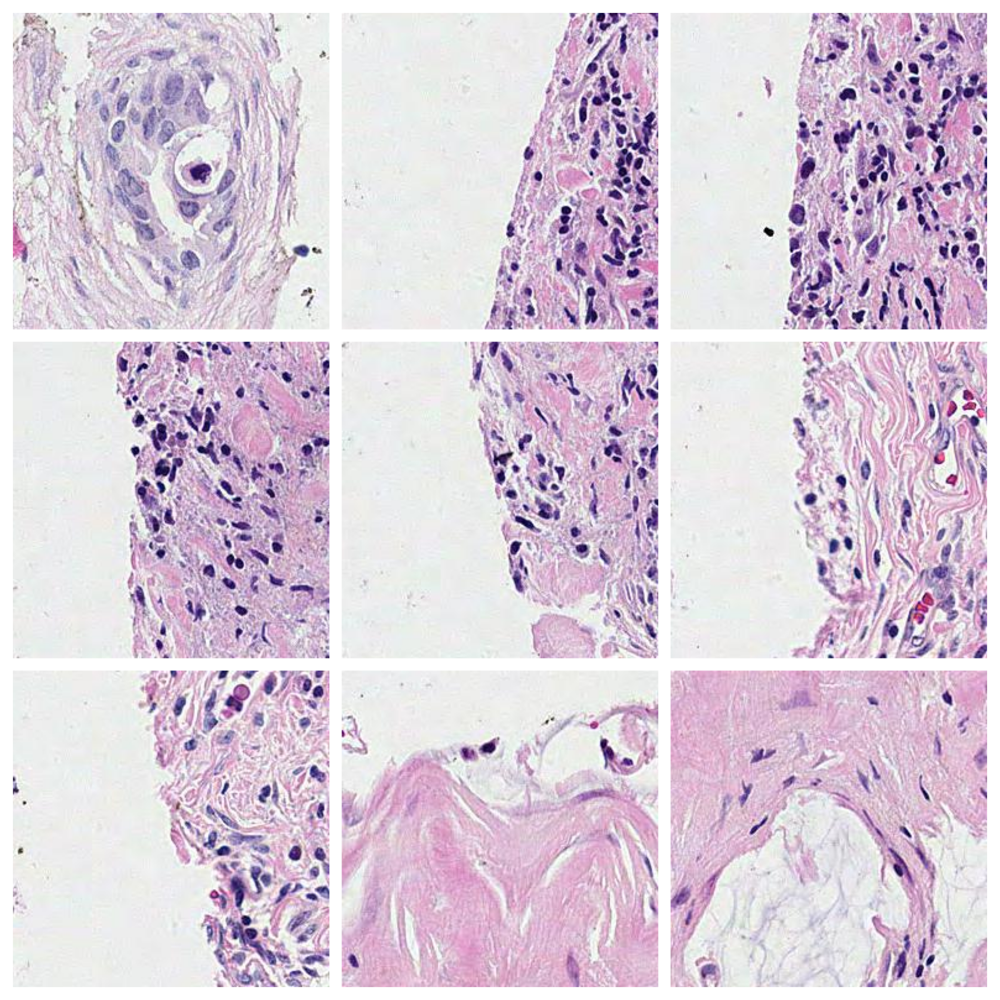

In [9]:
from onekey_algo.custom.components.habitat import display_image_grid, load_images_from_folder

display_image_grid(load_images_from_folder(r"doc/patches/"), 3, 3, margin=10)

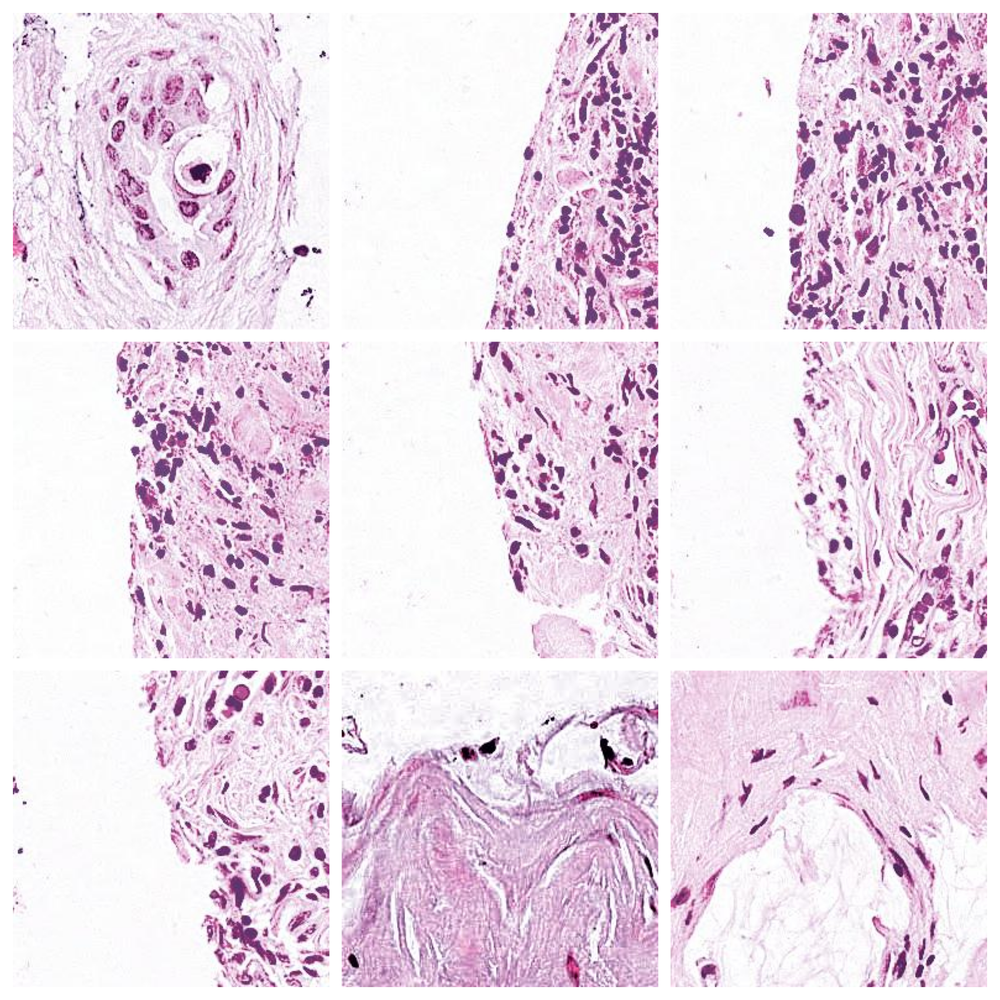

In [10]:
from onekey_algo.custom.components.habitat import display_image_grid, load_images_from_folder

display_image_grid(load_images_from_folder(r"doc/patches_norm/"), 3, 3, margin=10)